In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
def apresentaImg(imagem):
    img = plt.figure(figsize=(30,28))
    ax = img.add_subplot(111)
    ax.imshow(imagem, cmap = 'gray')
    plt.show()

In [5]:
leite_condensado = cv2.imread('leite_condensado.jpg')
leite_condensado = cv2.cvtColor(leite_condensado, cv2.COLOR_BGR2GRAY)

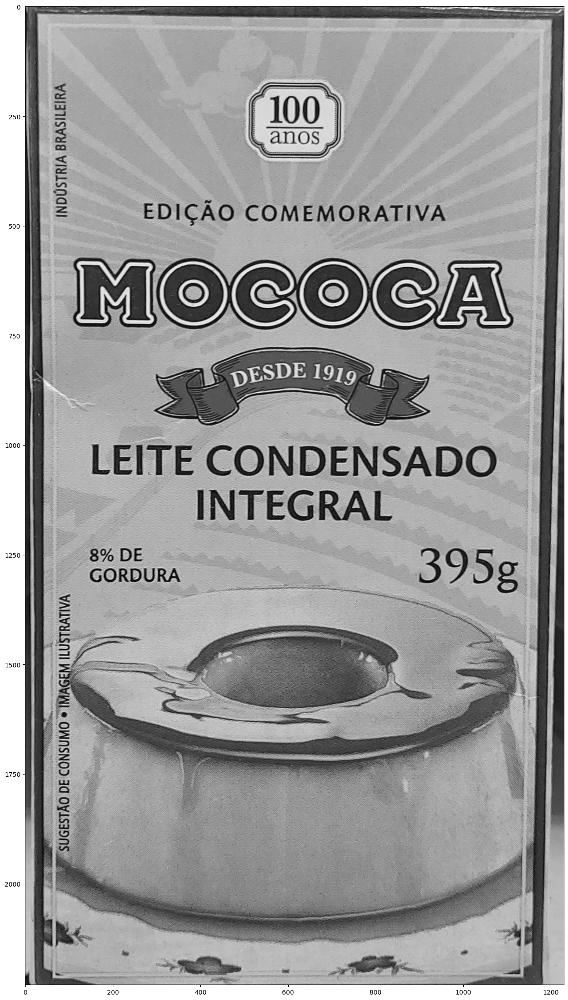

In [7]:
apresentaImg(leite_condensado)

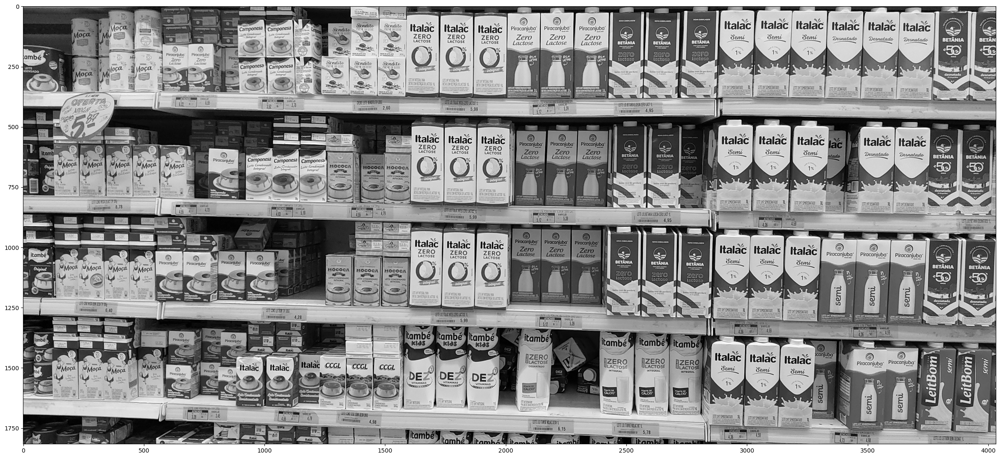

In [9]:
pratileira_leite = cv2.imread('pratileira_leite.jpg')
pratileira_leite = cv2.cvtColor(pratileira_leite, cv2.COLOR_BGR2GRAY)
apresentaImg(pratileira_leite)

In [10]:
pratileira_leite.shape

(1816, 4032)

In [13]:
#Detecção por força bruta
#objeto de deteção
#Vamos encontrar os pontos de deteção do objetvo
orb = cv2.ORB_create()

In [15]:
#Imagem e mascara
#Retorna
#pontos chaves e suas descrições
kp1, des1 = orb.detectAndCompute(leite_condensado, None)
kp2, des2 = orb.detectAndCompute(pratileira_leite, None)

In [16]:
#Criar o objetvo de comparação Matching
forca_bruta = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)


In [19]:
matches = forca_bruta.match(des1,des2)

In [21]:
matches = sorted(matches, key = lambda x:x.distance)

In [23]:
#junta as imagems e coloca linhas onde pode ser o match
leite_matches = cv2.drawMatches(leite_condensado, kp1, pratileira_leite, kp2, matches[:25], None, flags = 2)

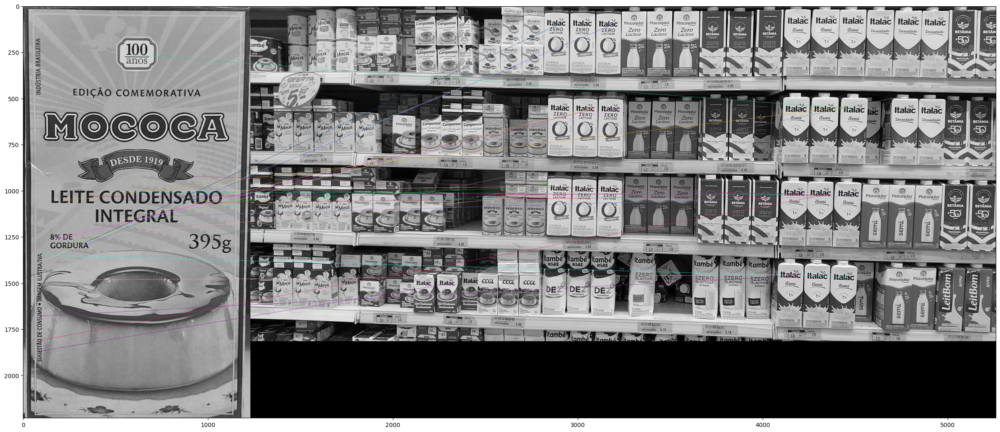

In [25]:
apresentaImg(leite_matches)